In [3]:
import pandas as pd
import numpy as np


In [4]:
import cv2
import matplotlib.pyplot as plt


In [5]:
!pip install -q transformers

## Loading the data

In [6]:
images="D:\Cow teat binary\Fine_Tune_VILT\Data1\Data\Images"

In [7]:
data=pd.read_csv("D:\Cow teat binary\Fine_Tune_VILT\metadata.csv")

In [8]:


data.head()

,Image,Question,Answer,File_Name
0,train_0422,Where are liver stem cells (oval cells) located?,in the canals of hering,./Data/Images/img_0001.jpg
1,train_0422,What are stained here with an immunohistochemi...,bile duct cells and canals of hering,./Data/Images/img_0001.jpg
2,train_0422,What are bile duct cells and canals of Hering ...,an immunohistochemical stain,./Data/Images/img_0001.jpg
3,train_0422,Are bile duct cells and canals of Hering stain...,yes,./Data/Images/img_0001.jpg
4,train_0986,What shows dissolution of the tissue?,an infarct in the brain,./Data/Images/img_0002.jpg


In [9]:
image=images+"/"+data["File_Name"][0].split('/')[-1]

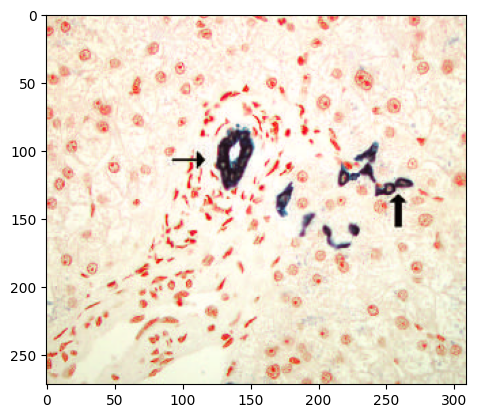

In [10]:
img=cv2.imread(image)
plt.imshow(img)

## Seperating: the data in Test, Train and Validation

In [11]:
import re

In [12]:
data["Image"][0].split("_")[0]

'train'

In [13]:
Train_data=data[data['Image'].apply(lambda x : x.split("_")[0])=='train']

In [14]:
Train_data.shape

(19654, 4)

In [15]:
Test_data=data[data['Image'].apply(lambda x : x.split("_")[0])=='test']

In [16]:
Test_data.shape

(6719, 4)

In [17]:
data.shape

(32632, 4)

In [18]:
val_data=data[data['Image'].apply(lambda x : x.split("_")[0])=='val']

In [19]:
val_data.shape

(6259, 4)

In [20]:
data['Image'].apply(lambda x : x.split("_")[0]).unique()

array(['train', 'val', 'test'], dtype=object)

In [25]:
data.head()

,Image,Question,Answer,File_Name
0,train_0422,Where are liver stem cells (oval cells) located?,in the canals of hering,./Data/Images/img_0001.jpg
1,train_0422,What are stained here with an immunohistochemi...,bile duct cells and canals of hering,./Data/Images/img_0001.jpg
2,train_0422,What are bile duct cells and canals of Hering ...,an immunohistochemical stain,./Data/Images/img_0001.jpg
3,train_0422,Are bile duct cells and canals of Hering stain...,yes,./Data/Images/img_0001.jpg
4,train_0986,What shows dissolution of the tissue?,an infarct in the brain,./Data/Images/img_0002.jpg


In [21]:
from PIL import Image

In [22]:
images

'D:\\Cow teat binary\\Fine_Tune_VILT\\Data1\\Data\\Images'

In [ ]:
images+"/"+data.iloc[0]["File_Name"].split('/')[-1]

'/content/drive/MyDrive/ViLT/ViLT/Code/Data/Images/img_0001.jpg'

In [23]:
import torch
from torch.utils.data import Dataset

## Exploring the Answers to convert the in single text value

In [ ]:
## Length of answers that has only one word

In [ ]:
#New_Trim_Train=Train_data[Train_data["Answer"].apply(lambda x : len(x.split(" "))==1)]

In [ ]:
#New_Trim_Test=Test_data[Test_data["Answer"].apply(lambda x : len(x.split(" "))==1)]

In [25]:
Train_data.shape

(19654, 4)

In [26]:
Test_data.shape

(6719, 4)

In [27]:
annotations= [i for i in data["Answer"]]

## Creating new label2id and id2label

In [29]:
# Update label2id
for new_word in annotations:
    if new_word not in config.label2id:
        new_label_index = len(config.label2id)
        config.label2id[new_word] = new_label_index

# Update id2label
config.id2label = {v: k for k, v in config.label2id.items()}

In [30]:
config.label2id["an evolving cancer"]

3524

In [31]:
config.id2label[3524]

'an evolving cancer'

In [32]:
Test_data.head()

,Image,Question,Answer,File_Name
25913,test_0167,"What are positively charged, thus allowing the...",the histone subunits,./Data/Images/img_3432.jpg
25914,test_0167,How are the histone subunits charged?,positively charged,./Data/Images/img_3432.jpg
25915,test_0167,"Are the histone subunits positively charged, t...",yes,./Data/Images/img_3432.jpg
25916,test_0099,What are illustrated?,the principal cellular alterations that charac...,./Data/Images/img_3433.jpg
25917,test_0099,Are the principal cellular alterations that ch...,yes,./Data/Images/img_3433.jpg


## Final Dataset for ViLt

## Adding config mapping

In [33]:
import pandas as pd
from torch.utils.data import Dataset
from transformers import ViltProcessor
from PIL import Image

class CustomDataset(Dataset):
    def __init__(self, dataframe, processor, label_mapping):
        self.data = dataframe
        self.processor = processor
        self.label_mapping = label_mapping

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        image = self.data.iloc[idx]['Image']
        question = self.data.iloc[idx]['Question']
        answer = self.data.iloc[idx]['Answer']
        file_name = "D:\Cow teat binary\Fine_Tune_VILT\Data1\Data\Images/" + self.data.iloc[idx]['File_Name'].split("/")[-1]
        image = Image.open(file_name).convert("RGB")

        # Check if the answer is in the label mapping
        if answer in self.label_mapping:
            label = self.label_mapping[answer]
        else:
            # If not in the mapping, assign a new label
            label = len(self.label_mapping)
            self.label_mapping[answer] = label

        encoding = self.processor(image, question, padding="max_length", truncation=True, return_tensors="pt")

        # Remove batch dimension
        for k, v in encoding.items():
            encoding[k] = v.squeeze()

        # Add label to encoding

        # Initialize the targets tensor for this instance
        targets = torch.zeros(len(self.label_mapping))

        # Update the targets tensor based on the label index
        targets[label] = 1.0  # Set the corresponding position to 1

        # Add the one-hot encoded labels tensor to the encoding
        encoding["labels"] = targets

        return encoding

          # Assuming 'label' is the key for the label index in your annotation
        # Assuming 'label' is the key for the label index in your annotation
        #encoding["labels"] = torch.tensor(label)

        #return encoding
# Example usage
# Assuming you have a config.label2id mapping




In [34]:
import torch

In [38]:

custom_dataset = CustomDataset(Train_data, processor=processor, label_mapping=config.label2id)

In [39]:
Test_dataset= CustomDataset(Test_data, processor=processor, label_mapping=config.label2id)

In [40]:
Valid_dataset= CustomDataset(val_data, processor=processor, label_mapping=config.label2id)

In [41]:
custom_dataset[90]

{'input_ids': tensor([  101,  2054,  2079,  1996,  2422,  2665, 26572,  5051, 13876,  8621,
        17254,  2000,  1029,   102,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0]), 'token_type_ids': tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), 'attention_mask': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), 'pixel_values': tensor([[[0.7255, 0.7255, 0.7255,  ..., 0.9686, 0.9686, 0.9686],
         [0.7255, 0.7255, 0.7255,  ..., 0.9922, 0.9922, 0.9922],
         [0.7255, 0.7255, 0.7255,  ..., 0.9922, 0.9922, 0.9922],
         ...,
         [0.7490, 0.7333, 0.7255,  ..., 1.0000, 1.0000, 1.0000],
         [0.7490, 0.7333, 0.7255,  ..., 1.0000, 1.0000, 1.0000],
     

In [42]:
processor.decode(custom_dataset[9]['input_ids'])

'[CLS] where do areas of white chalky deposits represent foci of fat necrosis with calcium soap formation? [SEP] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]'

In [43]:
labels = torch.nonzero(custom_dataset[0]['labels']).squeeze().tolist()

In [44]:
config.id2label[labels]

'in the canals of hering'

## Encoded labels class

In [2]:
from transformers import ViltForQuestionAnswering
from transformers import ViltConfig

config = ViltConfig.from_pretrained("dandelin/vilt-b32-finetuned-vqa")

In [45]:
model = ViltForQuestionAnswering.from_pretrained("dandelin/vilt-b32-mlm",
                                                 id2label=config.id2label,
                                                 label2id=config.label2id)

Some weights of ViltForQuestionAnswering were not initialized from the model checkpoint at dandelin/vilt-b32-mlm and are newly initialized: ['classifier.1.weight', 'classifier.3.weight', 'classifier.0.bias', 'classifier.3.bias', 'classifier.0.weight', 'classifier.1.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [45]:
len(config.label2id)

7975

In [46]:
len(config.id2label)

7975

In [1]:
from transformers import ViltProcessor

processor = ViltProcessor.from_pretrained("dandelin/vilt-b32-mlm")



In [47]:
from transformers import ViltForQuestionAnswering

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = ViltForQuestionAnswering.from_pretrained("dandelin/vilt-b32-mlm",
                                                 id2label=config.id2label,
                                                 label2id=config.label2id)
model.to(device)

Some weights of ViltForQuestionAnswering were not initialized from the model checkpoint at dandelin/vilt-b32-mlm and are newly initialized: ['classifier.3.weight', 'classifier.0.bias', 'classifier.1.bias', 'classifier.1.weight', 'classifier.3.bias', 'classifier.0.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


ViltForQuestionAnswering(
  (vilt): ViltModel(
    (embeddings): ViltEmbeddings(
      (text_embeddings): TextEmbeddings(
        (word_embeddings): Embedding(30522, 768)
        (position_embeddings): Embedding(40, 768)
        (token_type_embeddings): Embedding(2, 768)
        (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
        (dropout): Dropout(p=0.0, inplace=False)
      )
      (patch_embeddings): ViltPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(32, 32), stride=(32, 32))
      )
      (token_type_embeddings): Embedding(2, 768)
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViltEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViltLayer(
          (attention): ViltAttention(
            (attention): ViltSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=76

In [61]:
from torch.utils.data import DataLoader

def collate_fn(batch):
  input_ids = [item['input_ids'] for item in batch]
  pixel_values = [item['pixel_values'] for item in batch]
  attention_mask = [item['attention_mask'] for item in batch]
  token_type_ids = [item['token_type_ids'] for item in batch]
  labels = [item['labels'] for item in batch]

  # create padded pixel values and corresponding pixel mask
  encoding = processor.image_processor.pad(pixel_values, return_tensors="pt")

  # create new batch
  batch = {}
  batch['input_ids'] = torch.stack(input_ids)
  batch['attention_mask'] = torch.stack(attention_mask)
  batch['token_type_ids'] = torch.stack(token_type_ids)
  batch['pixel_values'] = encoding['pixel_values']
  batch['pixel_mask'] = encoding['pixel_mask']
  batch['labels'] = torch.stack(labels)

  return batch

train_dataloader = DataLoader(custom_dataset, collate_fn=collate_fn, batch_size=16, shuffle=True)

## Visualizing Batchloader

In [62]:
batch = next(iter(train_dataloader))

In [63]:
for k,v in batch.items():
  print(k, v.shape)

input_ids torch.Size([16, 40])
attention_mask torch.Size([16, 40])
token_type_ids torch.Size([16, 40])
pixel_values torch.Size([16, 3, 416, 576])
pixel_mask torch.Size([16, 416, 576])
labels torch.Size([16, 7975])


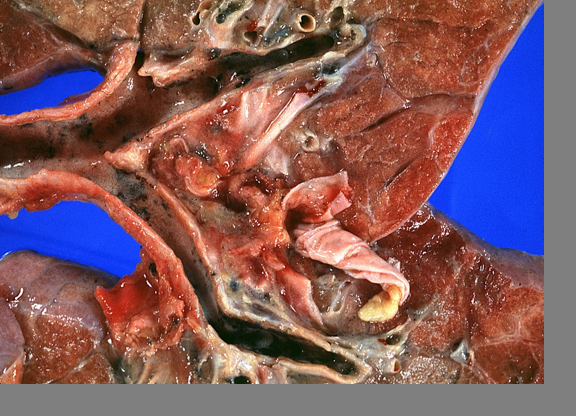

In [64]:
from PIL import Image
import numpy as np

image_mean = processor.image_processor.image_mean
image_std = processor.image_processor.image_std

batch_idx = 1

unnormalized_image = (batch["pixel_values"][batch_idx].numpy() * np.array(image_mean)[:, None, None]) + np.array(image_std)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
Image.fromarray(unnormalized_image)

In [65]:
processor.decode(batch["input_ids"][batch_idx])

'[CLS] does this image show lung? [SEP] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]'

In [66]:
labels = torch.nonzero(batch['labels'][batch_idx]).squeeze().tolist()

In [67]:
config.id2label[labels]

'yes'

In [55]:
from tqdm import tqdm

In [71]:
model.train()
for epoch in range(20):  # loop over the dataset multiple times
    print(f"Epoch: {epoch}")
    
    total_loss = 0.0
    num_batches = len(train_dataloader)
    
    for batch in tqdm(train_dataloader):
        # get the inputs
        batch = {k: v.to(device) for k, v in batch.items()}

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = model(**batch)
        loss = outputs.loss
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    average_loss = total_loss / num_batches
    print(f"Average Loss: {average_loss}")

    # Save the model after each epoch
    model.save_pretrained(f"model_checkpoint_epoch_{epoch}")

    # Optionally, save the optimizer state
    torch.save(optimizer.state_dict(), f"optimizer_checkpoint_epoch_{epoch}.pt")

Epoch: 0


100%|██████████| 1229/1229 [21:45<00:00,  1.06s/it]


Average Loss: 3.851457760429072
Epoch: 1


100%|██████████| 1229/1229 [20:28<00:00,  1.00it/s]


Average Loss: 3.201220077552671
Epoch: 2


100%|██████████| 1229/1229 [21:22<00:00,  1.04s/it]


Average Loss: 2.7287645862900796
Epoch: 3


100%|██████████| 1229/1229 [21:51<00:00,  1.07s/it]


Average Loss: 2.2957466192076708
Epoch: 4


100%|██████████| 1229/1229 [22:11<00:00,  1.08s/it]


Average Loss: 1.9128294906134136
Epoch: 5


100%|██████████| 1229/1229 [21:19<00:00,  1.04s/it]


Average Loss: 1.5775793705156802
Epoch: 6


100%|██████████| 1229/1229 [20:56<00:00,  1.02s/it]


Average Loss: 1.2868784277952232
Epoch: 7


100%|██████████| 1229/1229 [20:38<00:00,  1.01s/it]


Average Loss: 1.0383719657104464
Epoch: 8


100%|██████████| 1229/1229 [21:08<00:00,  1.03s/it]


Average Loss: 0.8139399970730841
Epoch: 9


100%|██████████| 1229/1229 [21:54<00:00,  1.07s/it]


Average Loss: 0.6680503804706479
Epoch: 10


100%|██████████| 1229/1229 [20:49<00:00,  1.02s/it]


Average Loss: 0.572831344438006
Epoch: 11


100%|██████████| 1229/1229 [21:16<00:00,  1.04s/it]


Average Loss: 0.49861045618995453
Epoch: 12


100%|██████████| 1229/1229 [21:10<00:00,  1.03s/it]


Average Loss: 0.481541830988372
Epoch: 13


100%|██████████| 1229/1229 [22:09<00:00,  1.08s/it]


Average Loss: 0.4227736538012366
Epoch: 14


100%|██████████| 1229/1229 [21:46<00:00,  1.06s/it]


Average Loss: 0.41969627818013894
Epoch: 15


100%|██████████| 1229/1229 [20:40<00:00,  1.01s/it]


Average Loss: 0.3899613543465867
Epoch: 16


100%|██████████| 1229/1229 [21:20<00:00,  1.04s/it]


Average Loss: 0.36340474589152655
Epoch: 17


100%|██████████| 1229/1229 [20:48<00:00,  1.02s/it]


Average Loss: 0.37795623959488467
Epoch: 18


100%|██████████| 1229/1229 [20:30<00:00,  1.00s/it]


Average Loss: 0.3657912774541187
Epoch: 19


100%|██████████| 1229/1229 [21:26<00:00,  1.05s/it]


Average Loss: 0.3513665658689314


In [77]:
model

ViltForQuestionAnswering(
  (vilt): ViltModel(
    (embeddings): ViltEmbeddings(
      (text_embeddings): TextEmbeddings(
        (word_embeddings): Embedding(30522, 768)
        (position_embeddings): Embedding(40, 768)
        (token_type_embeddings): Embedding(2, 768)
        (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
        (dropout): Dropout(p=0.0, inplace=False)
      )
      (patch_embeddings): ViltPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(32, 32), stride=(32, 32))
      )
      (token_type_embeddings): Embedding(2, 768)
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViltEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViltLayer(
          (attention): ViltAttention(
            (attention): ViltSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=76

## Inference

Let's verify whether the model has actually learned something:

In [74]:
example = Test_dataset[99]
print(example.keys())

dict_keys(['input_ids', 'token_type_ids', 'attention_mask', 'pixel_values', 'pixel_mask', 'labels'])


In [76]:
labels = torch.nonzero(Test_dataset[99]['labels']).squeeze().tolist()

In [80]:
config.id2label[labels]

'massive intracellular macrophage infection with acid-fast organisms'

In [77]:
processor.decode(example['input_ids'])

'[CLS] what does mycobacterium avium infection in a duodenal biopsy from a patient with aids show? [SEP] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]'

In [78]:
# add batch dimension + move to GPU
example = {k: v.unsqueeze(0).to(device) for k,v in example.items()}

# forward pass
outputs = model(**example)

Note that we need to apply a sigmoid activation on the logits since the model is trained using binary cross-entropy loss (as it frames VQA as a multi-label classification task).

In [95]:
logits = outputs.logits
predicted_classes = torch.sigmoid(logits)

probs, classes = torch.topk(predicted_classes, 5)

for prob, class_idx in zip(probs.squeeze().tolist(), classes.squeeze().tolist()):
  print(prob, model.config.id2label[class_idx])

0.977412760257721 no
0.011505301110446453 yes
3.7049344427941833e-06 female reproductive
1.6667439695083885e-06 Cardiovascular
1.3627812904815073e-06 metastatic carcinoma


In [87]:
probs, classes = torch.topk(predicted_classes, 5)

In [91]:
labels = torch.nonzero(custom_dataset[999]['labels']).squeeze().tolist()

In [92]:
config.id2label[labels]

'nests of closely packed glands'

## Evaluation

In [111]:
from collections import defaultdict
import re
import math
def split_sentence(sentence, n):
    words = defaultdict(int)
    tmp_sentence = re.sub("[^a-zA-Z ]", "", sentence)
    tmp_sentence = tmp_sentence.lower()
    tmp_sentence = tmp_sentence.strip().split()
    length = len(tmp_sentence)
    for i in range(length - n + 1):
        tmp_words = " ".join(tmp_sentence[i: i + n])
        if tmp_words:
            words[tmp_words] += 1
    return words

def brevity_penalty(candidate, references):
    c = len(candidate)
    ref_lens = (len(reference) for reference in references)
    r = min(ref_lens, key=lambda ref_len: (abs(ref_len - c), ref_len))
    
    if c > r:
        return 1
    else:
        return math.exp(1 - r / c)

def modified_precision(candidate, references, n):
    max_frequency = defaultdict(int)
    min_frequency = defaultdict(int)
    
    candidate_words = split_sentence(candidate, n)
    
    for reference in references:
        reference_words = split_sentence(reference, n)
        for word in candidate_words:
            max_frequency[word] = max(max_frequency[word], reference_words[word])
    for word in candidate_words:
            min_frequency[word] = min(max_frequency[word], candidate_words[word])
    P = sum(min_frequency.values()) / sum(candidate_words.values())
    return P

def bleu(candidate, references, n, weights):

    pn = []
    bp = brevity_penalty(candidate, references)
    for i in range(n):
        pn.append(modified_precision(candidate, references, i + 1))
    if len(weights) > len(pn):
        tmp_weights = []
        for i in range(len(pn)):
            tmp_weights.append(weights[i])
        bleu_result = calculate_bleu(tmp_weights, pn, n, bp)
        return str(bleu_result) + " (warning: the length of weights is bigger than n)"
    elif len(weights) < len(pn):
        tmp_weights = []
        for i in range(len(pn)):
            tmp_weights.append(0)
        for i in range(len(weights)):
            tmp_weights[i] = weights[i]
        bleu_result = calculate_bleu(tmp_weights, pn, n, bp)
        return str(bleu_result) + " (warning: the length of weights is smaller than n)"
    else:
        bleu_result = calculate_bleu(weights, pn, n, bp)
        return str(bleu_result)

#BLEU
def calculate_bleu(weights, pn, n, bp):
    sum_wlogp = 0
    for i in range(n):
        if pn[i] != 0:
            sum_wlogp += float(weights[i]) * math.log(pn[i])
    bleu_result = bp * math.exp(sum_wlogp)
    return bleu_result


def calculate_f1score(candidate, reference):
    # Remove special tokens
    candidate = candidate.replace("[CLS]", "").replace("[SEP]", "")
    reference = reference.replace("[CLS]", "").replace("[SEP]", "")

    candidate_words = split_sentence(candidate, 1)
    reference_words = split_sentence(reference, 1)
    word_set = set()
    for word in candidate_words:
        word_set.add(word)
    for word in reference_words:
        word_set.add(word)
    
    tp = 0
    fp = 0
    fn = 0
    for word in word_set:
        if word in candidate_words and word in reference_words:
            tp += candidate_words[word]
        elif word in candidate_words and word not in reference_words:
            fp += candidate_words[word]
        elif word not in candidate_words and word in reference_words:
            fn += reference_words[word]
    
    if len(candidate_words) == 0:
        return "0 (warning: length of candidate's words is 0)"
    elif len(reference_words) == 0:
        return 0
    else:
        precision = tp / (tp + fp)
        recall = tp / (tp + fn)
        if tp == 0:
            return 0
        else:
            return 2 * precision * recall / (precision + recall)

def calculate_exactmatch(candidate, reference):
    candidate_words = split_sentence(candidate, 1)
    reference_words = split_sentence(reference, 1)
    count = 0
    total = 0
    for word in reference_words:
        if word in candidate_words:
            count += 1
    for word in candidate_words:
        total += candidate_words[word]
        
    if total == 0:
        return "0 (warning: length of candidate's words is 0)"
    else:
        return count / total

## Exact match

In [157]:
def calculate_exactmatch(candidate, reference):
    # Ensure candidate and reference are strings
    if not isinstance(candidate, str) or not isinstance(reference, str):
        # Handle non-string inputs
        return 0  # Or any other appropriate value

    candidate_words = split_sentence(candidate, 1)
    reference_words = split_sentence(reference, 1)
    count = 0
    total = 0
    for word in reference_words:
        if word in candidate_words:
            count += 1
    for word in candidate_words:
        total += candidate_words[word]
        
    if total == 0:
        return 0  # or any other appropriate value
    else:
        return count / total


## F1 Score

In [150]:
def calculate_f1score(candidate, reference):
    # Remove special tokens

    candidate_words = split_sentence(candidate, 1)
    reference_words = split_sentence(reference, 1)
    word_set = set()
    for word in candidate_words:
        word_set.add(word)
    for word in reference_words:
        word_set.add(word)
    
    tp = 0
    fp = 0
    fn = 0
    for word in word_set:
        if word in candidate_words and word in reference_words:
            tp += candidate_words[word]
        elif word in candidate_words and word not in reference_words:
            fp += candidate_words[word]
        elif word not in candidate_words and word in reference_words:
            fn += reference_words[word]
    
    if len(candidate_words) == 0:
        return 0  # Handle case where length is 0
    elif len(reference_words) == 0:
        return 0
    else:
        precision = tp / (tp + fp)
        recall = tp / (tp + fn)
        if tp == 0:
            return 0
        else:
            return 2 * precision * recall / (precision + recall)


In [114]:
import torch
import random
import re
import numpy as np
from collections import defaultdict
from tqdm import tqdm

# Your previously provided functions for BLEU, F1 score, and exact match
# ...

# Assuming test_dataset is a PyTorch dataset containing your test data
num_samples = len(Test_dataset)

f1_total, exact, bleu_1, bleu_2, bleu_3 = 0.0, 0.0, 0.0, 0.0, 0.0

for sample_index in tqdm(range(num_samples), desc="Processing Test_dataset", unit="sample"):
    example = Test_dataset[sample_index]
    question = processor.decode(example['input_ids'])
    question = re.sub(r'\[PAD\]', '', question)  # Remove [PAD] tokens
    
    labels = torch.nonzero(example['labels']).squeeze().tolist()
    label_ans = config.id2label[labels]
    
    # Add batch dimension + move to GPU if applicable
    example = {k: v.unsqueeze(0).to(device) for k, v in example.items()}
    
    # Forward pass
    outputs = model(**example)
    logits = outputs.logits
    predicted_classes = torch.sigmoid(logits)
    
    # Get topk predictions
    probs, classes = torch.topk(predicted_classes, 1)
    top_class_idx = classes.item()  # Use item() to get the integer value
    top_class_label = model.config.id2label[top_class_idx]
    
    # Calculate metrics
    f1_total += calculate_f1score(top_class_label, label_ans)
    #exact += calculate_exactmatch(top_class_label, label_ans)
    #bleu_1 += float(bleu(top_class_label, [label_ans], 1, [1]))
    # bleu_2 += float(bleu(top_class_label, [label_ans], 2, [1, 1]))
    # bleu_3 += float(bleu(top_class_label, [label_ans], 3, [1, 1, 1]))

# Calculate averages
avg_f1 = f1_total / num_samples
#avg_exact = exact / num_samples
#avg_bleu_1 = bleu_1 / num_samples
# avg_bleu_2 = bleu_2 / num_samples
# avg_bleu_3 = bleu_3 / num_samples

# Print average metrics
print(f'Average F1: {avg_f1}')
#print(f'Average Exact Match: {avg_exact}')
#print(f'Average BLEU-1: {avg_bleu_1}')
# print(f'Average BLEU-2: {avg_bleu_2}')
# print(f'Average BLEU-3: {avg_bleu_3}')


Processing Test_dataset:   0%|          | 0/6719 [00:00<?, ?sample/s]

Processing Test_dataset: 100%|██████████| 6719/6719 [08:43<00:00, 12.83sample/s]

Average F1: 0.6245359111957672


## Exact match

In [ ]:
def calculate_exactmatch(candidate, reference):
    # Ensure candidate and reference are strings
    if not isinstance(candidate, str) or not isinstance(reference, str):
        # Handle non-string inputs
        return 0  # Or any other appropriate value

    candidate_words = split_sentence(candidate, 1)
    reference_words = split_sentence(reference, 1)
    count = 0
    total = 0
    for word in reference_words:
        if word in candidate_words:
            count += 1
    for word in candidate_words:
        total += candidate_words[word]
        
    if total == 0:
        return 0  # or any other appropriate value
    else:
        return count / total


In [162]:
import torch
import random
import re
import numpy as np
from collections import defaultdict
from tqdm import tqdm

# Your previously provided functions for BLEU, F1 score, and exact match
# ...

# Assuming test_dataset is a PyTorch dataset containing your test data
num_samples = len(Test_dataset)

f1_total, exact, bleu_1, bleu_2, bleu_3 = 0.0, 0.0, 0.0, 0.0, 0.0

for sample_index in tqdm(range(num_samples), desc="Processing Test_dataset", unit="sample"):
    example = Test_dataset[sample_index]
    
    labels = torch.nonzero(example['labels']).squeeze().tolist()
    label_ans = config.id2label[labels]
    
    # Add batch dimension + move to GPU if applicable
    example = {k: v.unsqueeze(0).to(device) for k, v in example.items()}
    
    # Forward pass
    outputs = model(**example)
    logits = outputs.logits
    predicted_classes = torch.sigmoid(logits)
    
    # Get topk predictions
    probs, classes = torch.topk(predicted_classes, 1)
    top_class_idx = classes.item()  # Use item() to get the integer value
    top_class_label = model.config.id2label[top_class_idx]
    
    # Calculate metrics
    #f1_total += calculate_f1score(top_class_label, label_ans)
    exact += calculate_exactmatch(top_class_label, label_ans)
    #bleu_1 += float(bleu(top_class_label, [label_ans], 1, [1]))
    # bleu_2 += float(bleu(top_class_label, [label_ans], 2, [1, 1]))
    # bleu_3 += float(bleu(top_class_label, [label_ans], 3, [1, 1, 1]))

# Calculate averages
#avg_f1 = f1_total / num_samples
avg_exact = exact / num_samples
#avg_bleu_1 = bleu_1 / num_samples
# avg_bleu_2 = bleu_2 / num_samples
# avg_bleu_3 = bleu_3 / num_samples

# Print average metrics
#print(f'Average F1: {avg_f1}')
#print(f'Average Exact Match: {avg_exact}')
#print(f'Average BLEU-1: {avg_bleu_1}')
# print(f'Average BLEU-2: {avg_bleu_2}')
# print(f'Average BLEU-3: {avg_bleu_3}')


Processing Test_dataset: 100%|██████████| 6719/6719 [08:43<00:00, 12.84sample/s]


In [170]:
print(f'Average Exact Match: {avg_exact}')

Average Exact Match: 0.6266813261652591


## Valid  data exact match

In [171]:
import torch
import random
import re
import numpy as np
from collections import defaultdict
from tqdm import tqdm

# Your previously provided functions for BLEU, F1 score, and exact match
# ...

# Assuming test_dataset is a PyTorch dataset containing your test data
num_samples = len(Valid_dataset)

f1_total, exact, bleu_1, bleu_2, bleu_3 = 0.0, 0.0, 0.0, 0.0, 0.0

for sample_index in tqdm(range(num_samples), desc="Processing Test_dataset", unit="sample"):
    example = Test_dataset[sample_index]
    
    labels = torch.nonzero(example['labels']).squeeze().tolist()
    label_ans = config.id2label[labels]
    
    # Add batch dimension + move to GPU if applicable
    example = {k: v.unsqueeze(0).to(device) for k, v in example.items()}
    
    # Forward pass
    outputs = model(**example)
    logits = outputs.logits
    predicted_classes = torch.sigmoid(logits)
    
    # Get topk predictions
    probs, classes = torch.topk(predicted_classes, 1)
    top_class_idx = classes.item()  # Use item() to get the integer value
    top_class_label = model.config.id2label[top_class_idx]
    
    # Calculate metrics
    #f1_total += calculate_f1score(top_class_label, label_ans)
    exact += calculate_exactmatch(top_class_label, label_ans)
    #bleu_1 += float(bleu(top_class_label, [label_ans], 1, [1]))
    # bleu_2 += float(bleu(top_class_label, [label_ans], 2, [1, 1]))
    # bleu_3 += float(bleu(top_class_label, [label_ans], 3, [1, 1, 1]))

# Calculate averages
#avg_f1 = f1_total / num_samples
avg_exact = exact / num_samples
#avg_bleu_1 = bleu_1 / num_samples
# avg_bleu_2 = bleu_2 / num_samples
# avg_bleu_3 = bleu_3 / num_samples

# Print average metrics
#print(f'Average F1: {avg_f1}')
#print(f'Average Exact Match: {avg_exact}')
#print(f'Average BLEU-1: {avg_bleu_1}')
# print(f'Average BLEU-2: {avg_bleu_2}')
# print(f'Average BLEU-3: {avg_bleu_3}')


Processing Test_dataset: 100%|██████████| 6259/6259 [08:06<00:00, 12.87sample/s]


In [173]:
Valid_exact_match= avg_exact
print(f'Average Valid Exact Match: {Valid_exact_match}')

Average Valid Exact Match: 0.6208796484092131


## Visualizing the the model prediction on test dataset

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


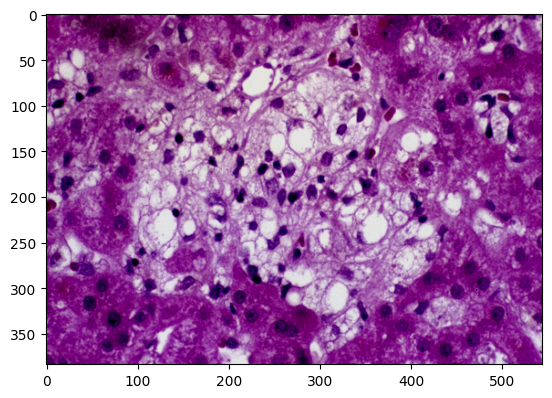

Question: [CLS] is situs inversus present? [SEP]                              
Original Answer: no
Predicted Answer: no



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


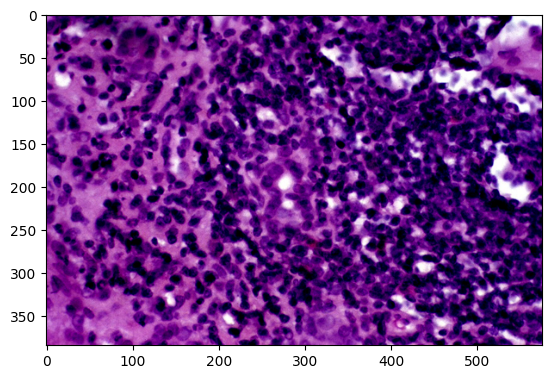

Question: [CLS] is cervical carcinoma present? [SEP]                               
Original Answer: no
Predicted Answer: no



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


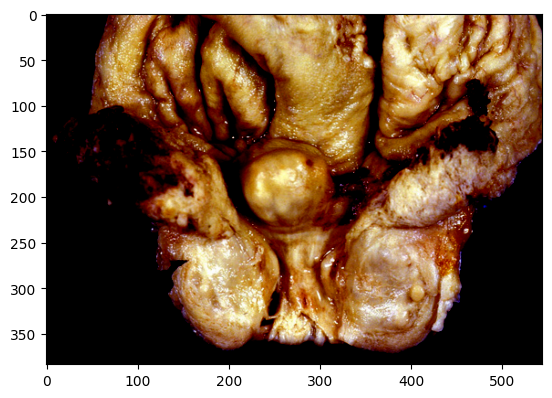

Question: [CLS] does hydrocele show prostatic hyperplasia? [SEP]                           
Original Answer: no
Predicted Answer: no



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


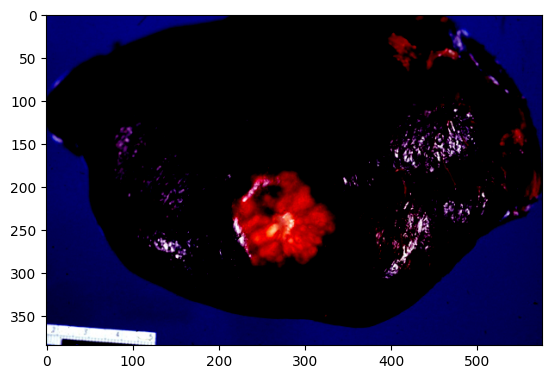

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Question: [CLS] what is present? [SEP]                                  
Original Answer: spleen
Predicted Answer: hematologic



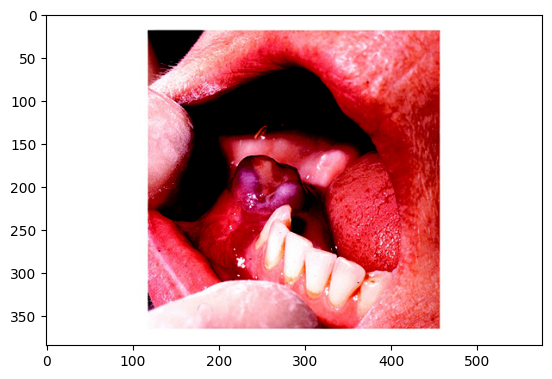

Question: [CLS] is oral present? [SEP]                                  
Original Answer: yes
Predicted Answer: yes



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


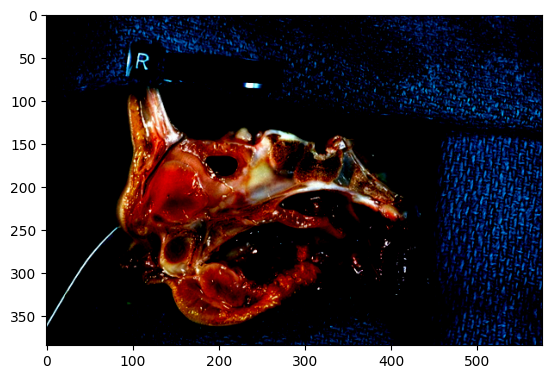

Question: [CLS] what is present? [SEP]                                  
Original Answer: choanal atresia
Predicted Answer: female reproductive



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


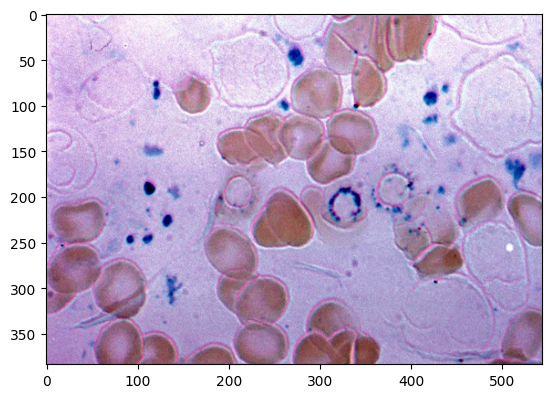

Question: [CLS] what stain excellent example source unknown? [SEP]                               
Original Answer: iron
Predicted Answer: iron



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


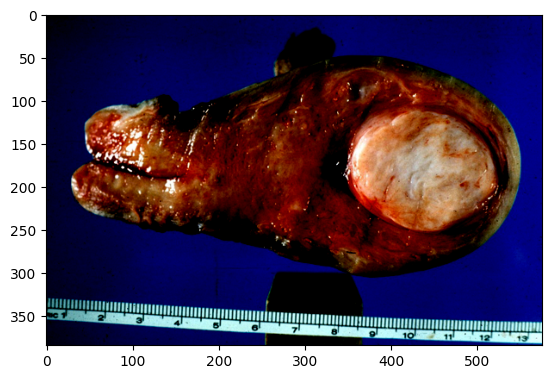

Question: [CLS] what is present? [SEP]                                  
Original Answer: leiomyoma
Predicted Answer: metastatic carcinoma



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


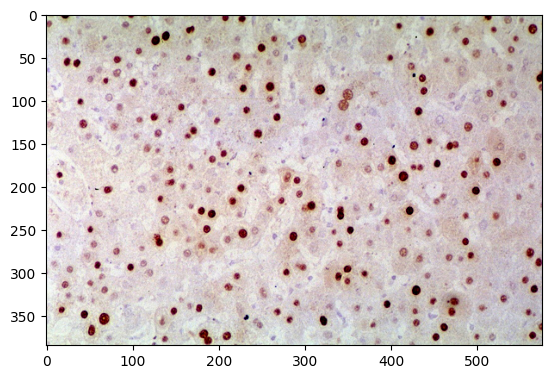

Question: [CLS] does band constriction in skin above ankle of infant show hepatitis b virus, hbve antigen immunohistochemistry? [SEP]          
Original Answer: no
Predicted Answer: no



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


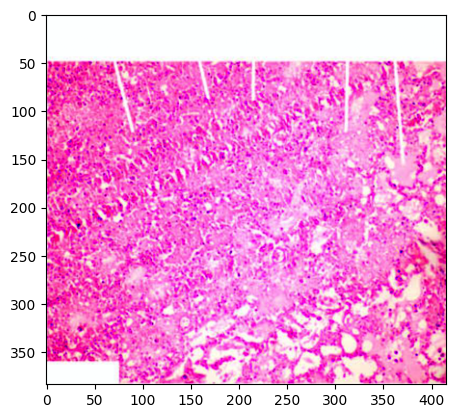

Question: [CLS] what does infarcted area show? [SEP]                              
Original Answer: ghostal veoli filled with blood
Predicted Answer: ingrowth of inflammatory granulation tissue



In [107]:
import torch
import random
import re
import matplotlib.pyplot as plt

# Assuming test_dataset is a PyTorch dataset containing your test data
num_samples = 10
random_samples = random.sample(range(len(Test_dataset)), num_samples)

for sample_index in random_samples:
    example = Test_dataset[sample_index]
    question = processor.decode(example['input_ids'])
    question = re.sub(r'\[PAD\]|[CLS]|[SEP]', '', question)  # Remove [PAD] tokens
    
    labels = torch.nonzero(Test_dataset[sample_index]['labels']).squeeze().tolist()
    label_ans = config.id2label[labels]
    
    # Add batch dimension + move to GPU if applicable
    example = {k: v.unsqueeze(0).to(device) for k, v in example.items()}
    
    # Forward pass
    outputs = model(**example)
    logits = outputs.logits
    predicted_classes = torch.sigmoid(logits)
    
    # Get topk predictions
    probs, classes = torch.topk(predicted_classes, 1)
    top_class_idx = classes.item()  # Use item() to get the integer value
    top_class_label = model.config.id2label[top_class_idx]
    
    # Display the image with the input question, original answer, and predicted answer
    image_data = example['pixel_values'].squeeze().cpu().numpy()  # Assuming 'pixel_values' is the key for your image tensor
    
    # Remove the first dimension if it exists
    if image_data.shape[0] == 3:
        image_data = image_data.transpose(1, 2, 0)
    
    # Print the decoded question, original answer, and predicted answer
    plt.imshow(image_data)
    plt.show()
    
    print(f"Question: {question}")
    print(f"Original Answer: {label_ans}")
    print(f"Predicted Answer: {top_class_label}\n")


## Inference

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


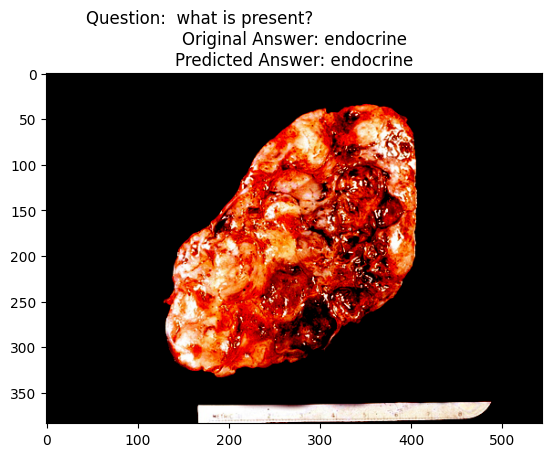

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


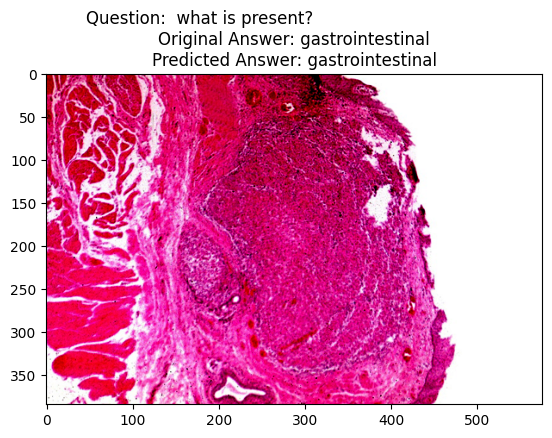

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


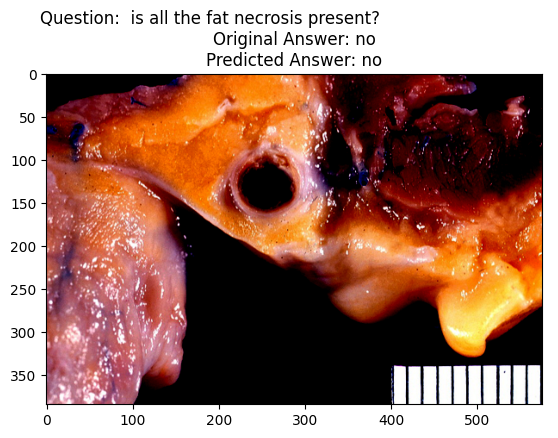

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


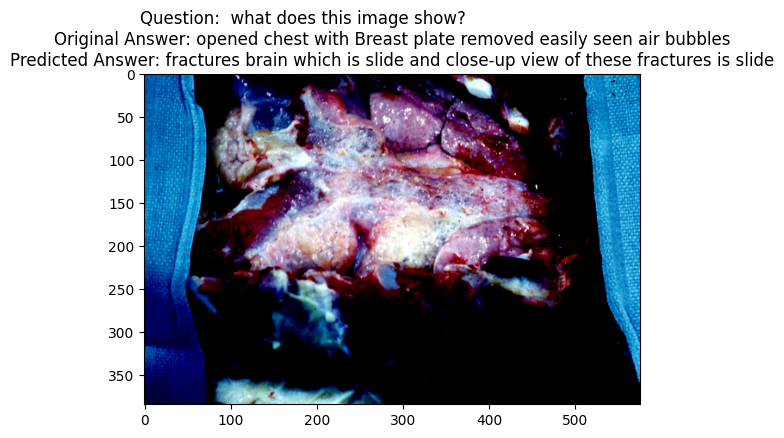

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


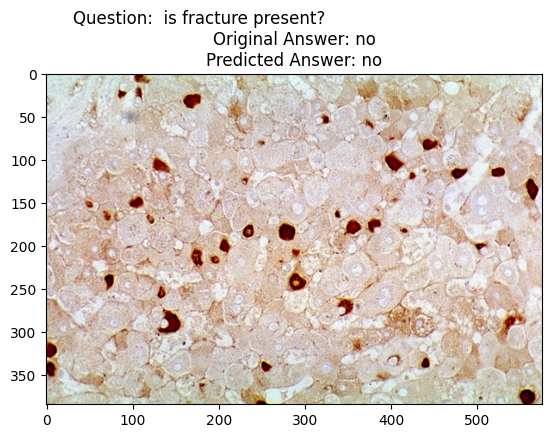

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


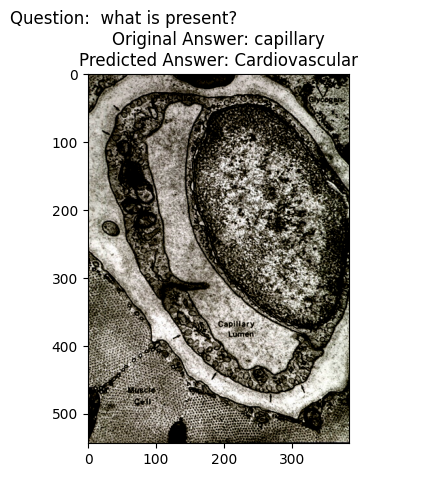

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


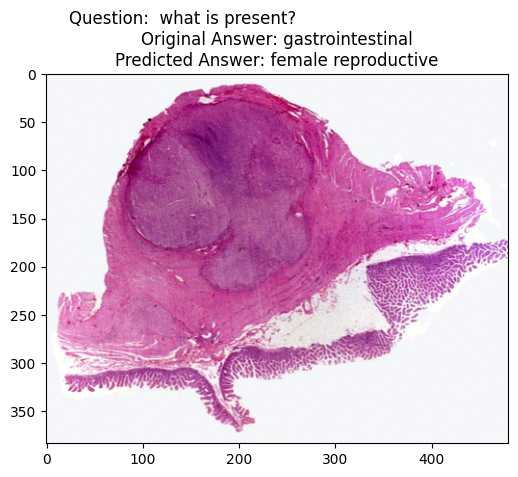

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


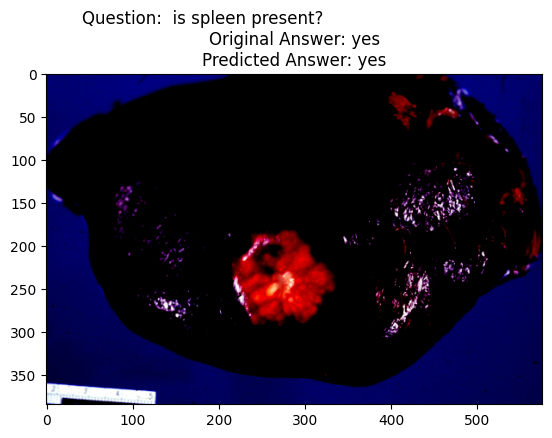

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


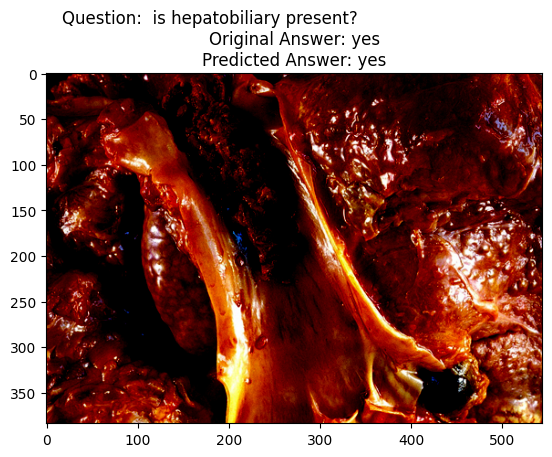

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


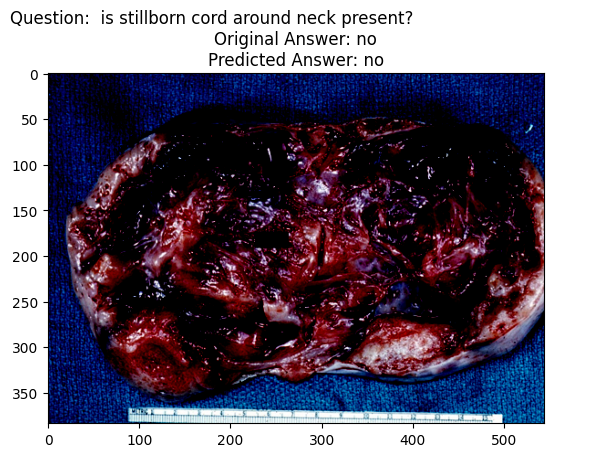

In [169]:
import torch
import random
import matplotlib.pyplot as plt

# Assuming test_dataset is a PyTorch dataset containing your test data
num_samples = 10
random_samples = random.sample(range(len(Test_dataset)), num_samples)

for sample_index in random_samples:
    example = Test_dataset[sample_index]
    question=processor.decode(example['input_ids'])
    question= question.replace("[PAD]","").replace("[SEP]","").replace("[CLS]","")
    labels = torch.nonzero(Test_dataset[sample_index]['labels']).squeeze().tolist()
    label_ans=config.id2label[labels]
    
    # Add batch dimension + move to GPU if applicable
    example = {k: v.unsqueeze(0).to(device) for k, v in example.items()}
    
    # Forward pass
    outputs = model(**example)
    logits = outputs.logits
    predicted_classes = torch.sigmoid(logits)
    
    # Get topk predictions
    probs, classes = torch.topk(predicted_classes, 1)
    top_class_idx = classes.item()  # Use item() to get the integer value
    top_class_label = model.config.id2label[top_class_idx]
    
    # Display the image with the input question, original answer, and predicted answer
    image_data = example['pixel_values'].squeeze().cpu().numpy()  # Assuming 'pixel_values' is the key for your image tensor
    
    # Remove the first dimension if it exists
    if image_data.shape[0] == 3:
        image_data = image_data.transpose(1, 2, 0)
    
    plt.imshow(image_data)
    plt.title(f"Question: {question} \nOriginal Answer: {label_ans}\nPredicted Answer: {top_class_label}")
    plt.show()


## Valid data set prediction visualising

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


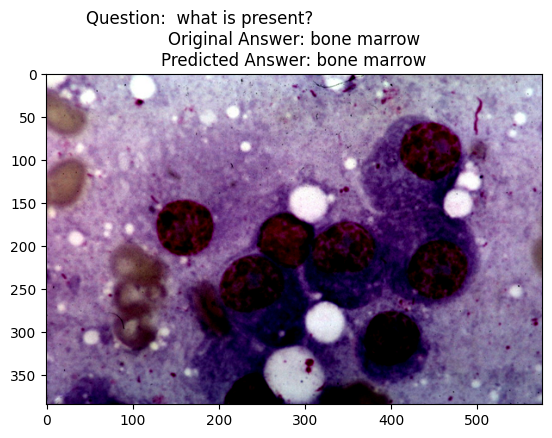

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


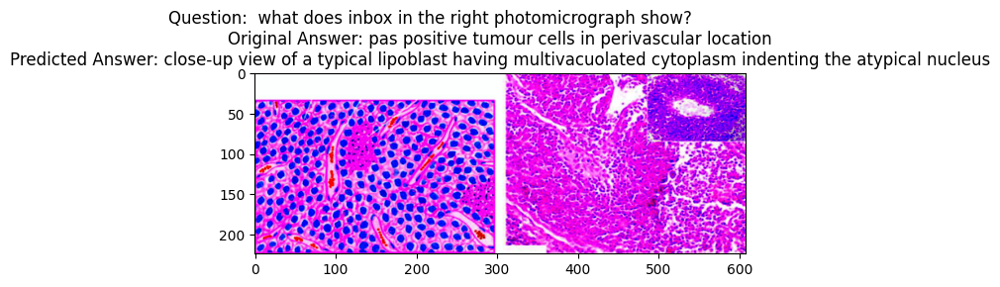

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


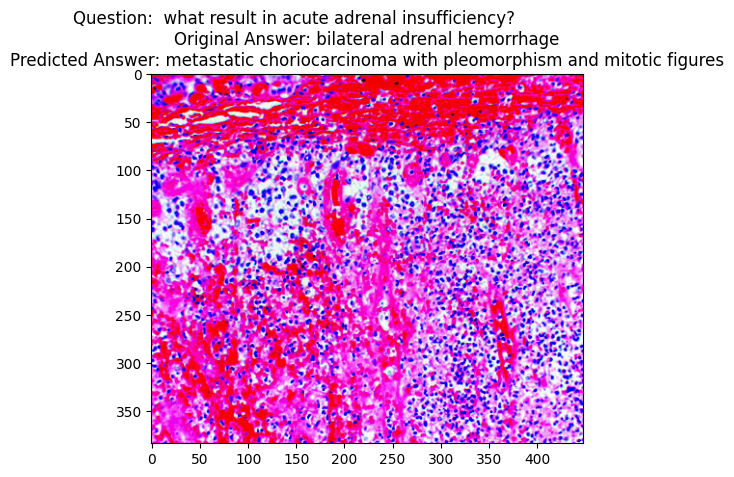

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


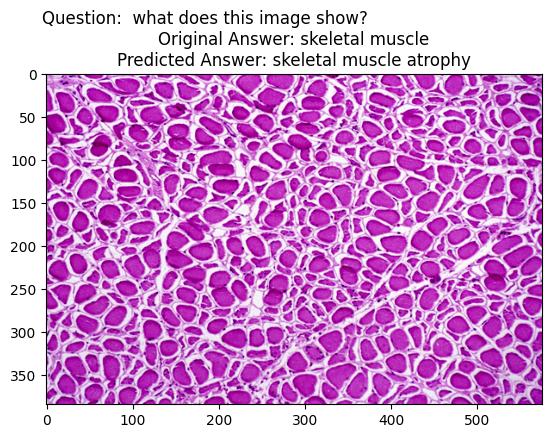

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


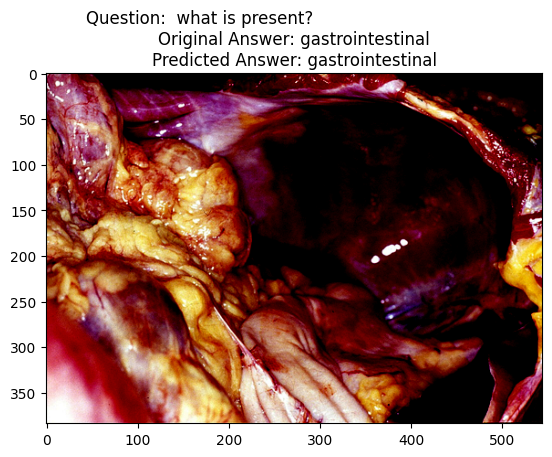

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


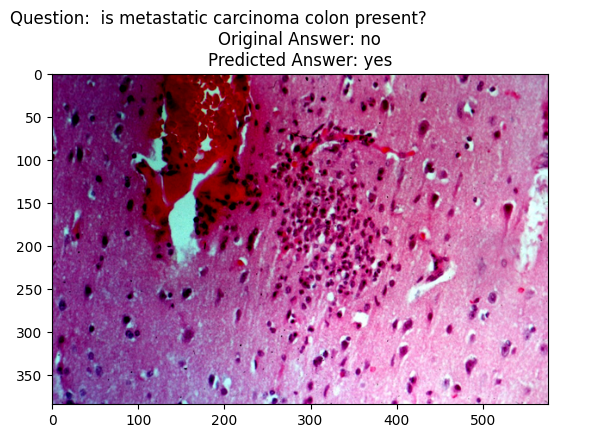

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


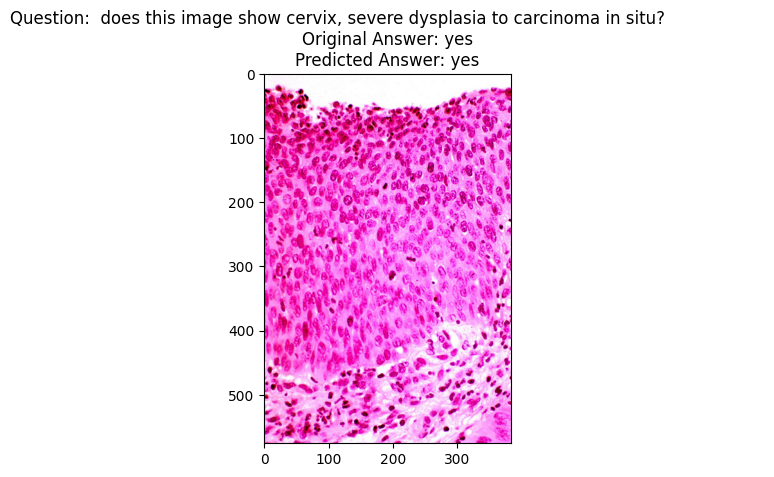

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


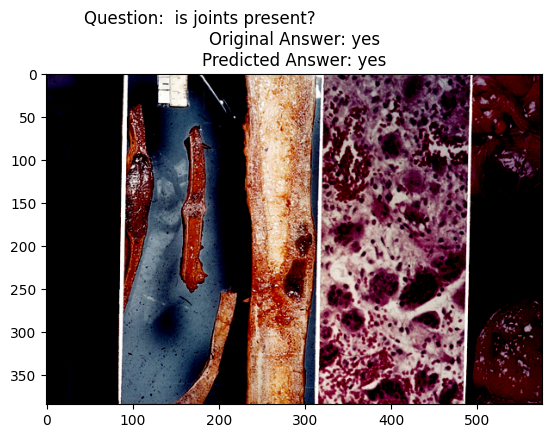

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


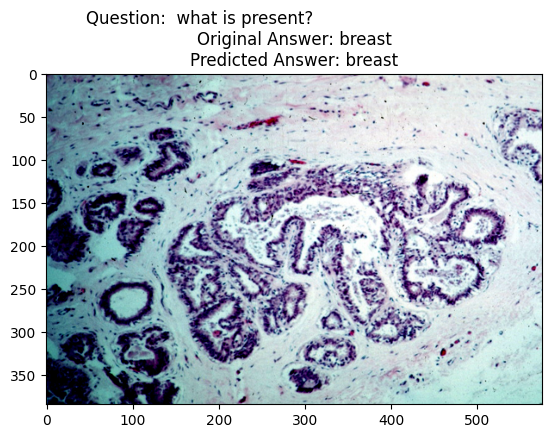

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


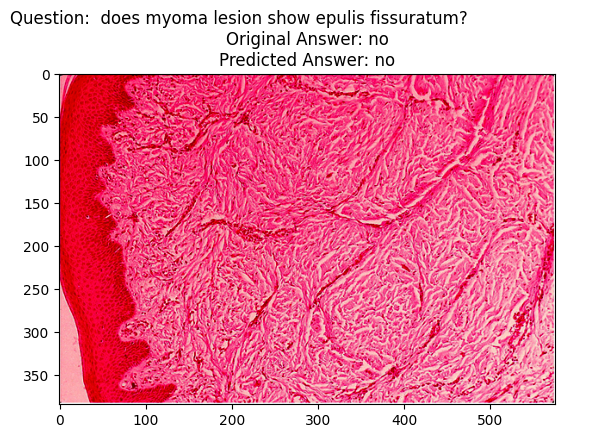

In [174]:
import torch
import random
import matplotlib.pyplot as plt

# Assuming test_dataset is a PyTorch dataset containing your test data
num_samples = 10
random_samples = random.sample(range(len(Valid_dataset)), num_samples)

for sample_index in random_samples:
    example = Test_dataset[sample_index]
    question=processor.decode(example['input_ids'])
    question= question.replace("[PAD]","").replace("[SEP]","").replace("[CLS]","")
    labels = torch.nonzero(Test_dataset[sample_index]['labels']).squeeze().tolist()
    label_ans=config.id2label[labels]
    
    # Add batch dimension + move to GPU if applicable
    example = {k: v.unsqueeze(0).to(device) for k, v in example.items()}
    
    # Forward pass
    outputs = model(**example)
    logits = outputs.logits
    predicted_classes = torch.sigmoid(logits)
    
    # Get topk predictions
    probs, classes = torch.topk(predicted_classes, 1)
    top_class_idx = classes.item()  # Use item() to get the integer value
    top_class_label = model.config.id2label[top_class_idx]
    
    # Display the image with the input question, original answer, and predicted answer
    image_data = example['pixel_values'].squeeze().cpu().numpy()  # Assuming 'pixel_values' is the key for your image tensor
    
    # Remove the first dimension if it exists
    if image_data.shape[0] == 3:
        image_data = image_data.transpose(1, 2, 0)
    
    plt.imshow(image_data)
    plt.title(f"Question: {question} \nOriginal Answer: {label_ans}\nPredicted Answer: {top_class_label}")
    plt.show()
